# Rainfall Prediction is:
one of the difficult and uncertain tasks that have a significant impact on human society. Timely and accurate forecasting can proactively help reduce human and financial loss. This study presents a set of experiments that involve the use of common machine learning techniques to create models that can predict whether it will rain tomorrow or not based on the weather data for that day in major cities in Australia.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('rainfallprediction.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


The dataset contain 8425 rows and 23 columns

In [3]:
print('Number of Rows:',df.shape[0])
print('Number of Columns:',df.shape[1])

Number of Rows: 8425
Number of Columns: 23


In [4]:
df.shape

(8425, 23)

In [5]:
df.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
df.tail(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [7]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

As we can see dataset contain 1663 duplicated values

In [8]:
df.duplicated().sum()

1663

In [9]:
df.drop_duplicates(keep='last',inplace=True)

We have dropped the duplicated value from dataset

In [10]:
df.duplicated().sum()

0

In [11]:
df.isin([' ?']).sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

As we can see there is no whitespace in the dataset

In [12]:
df.isin([' ','NA','-']).sum().any() #No whitespace prsent in data

False

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6692 non-null   float64
 3   MaxTemp        6705 non-null   float64
 4   Rainfall       6624 non-null   float64
 5   Evaporation    3841 non-null   float64
 6   Sunshine       3526 non-null   float64
 7   WindGustDir    5820 non-null   object 
 8   WindGustSpeed  5820 non-null   float64
 9   WindDir9am     5968 non-null   object 
 10  WindDir3pm     6468 non-null   object 
 11  WindSpeed9am   6699 non-null   float64
 12  WindSpeed3pm   6662 non-null   float64
 13  Humidity9am    6708 non-null   float64
 14  Humidity3pm    6666 non-null   float64
 15  Pressure9am    5454 non-null   float64
 16  Pressure3pm    5451 non-null   float64
 17  Cloud9am       4896 non-null   float64
 18  Cloud3pm

In [14]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [15]:
Categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        Categorical_col.append(i)
print('Categorical columns:',Categorical_col)

Numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        Numerical_col.append(i)
print('Numerical columns:',Numerical_col)

Categorical columns: ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
Numerical columns: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [16]:
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

We have dropped the date column from dataset as it is not useful for our modelling

In [17]:
df.drop('Date',axis=1,inplace=True)

<Axes: >

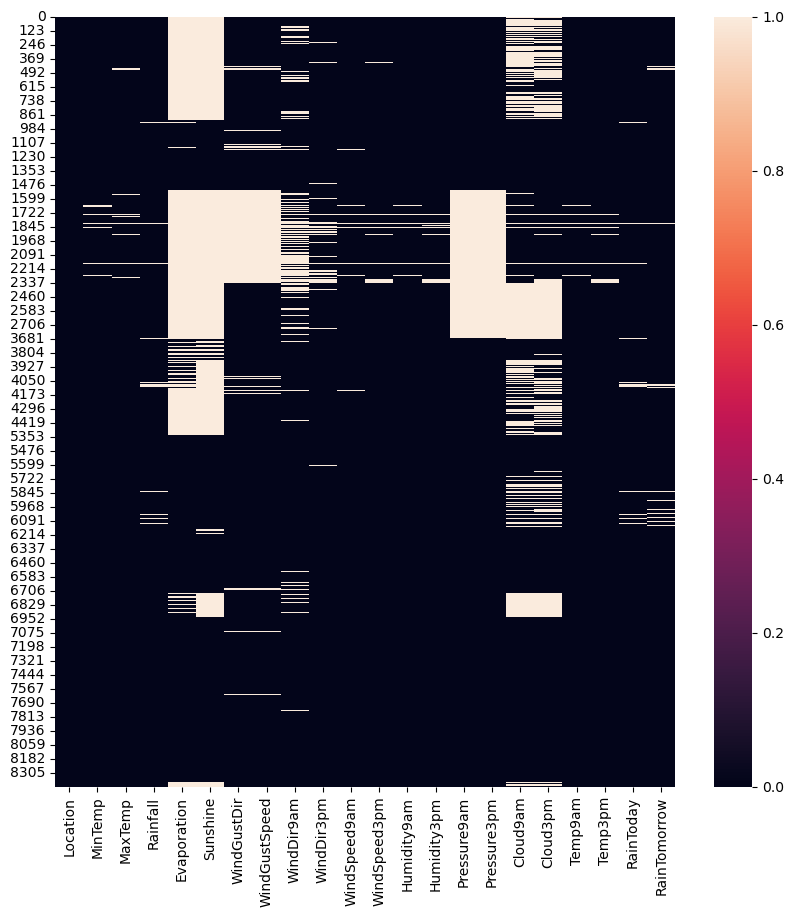

In [18]:
plt.figure(figsize=(10,10))
sns.heatmap(df.isnull())

We are replacing the null values by mean

In [19]:
df['WindGustDir'].fillna("N",inplace=True)
df['WindDir9am'].fillna('N',inplace=True)
df['WindDir3pm'].fillna('SE',inplace=True)
df['RainToday'].fillna('No',inplace=True)
df['RainTomorrow'].fillna('No',inplace=True)

In [20]:
df['MinTemp'].fillna(df['MinTemp'].mean(),inplace=True)
df['MaxTemp'].fillna(df['MaxTemp'].mean(),inplace=True)
df['Rainfall'].fillna(df['Rainfall'].mean(),inplace=True)
df['Evaporation'].fillna(df['Evaporation'].mean(),inplace=True)
df['Sunshine'].fillna(df['Sunshine'].mean(),inplace=True)
df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean(),inplace=True)
df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean(),inplace=True)
df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean(),inplace=True)
df['Humidity9am'].fillna(df['Humidity9am'].mean(),inplace=True)
df['Humidity3pm'].fillna(df['Humidity3pm'].mean(),inplace=True)
df['Pressure9am'].fillna(df['Pressure9am'].mean(),inplace=True)
df['Pressure3pm'].fillna(df['Pressure3pm'].mean(),inplace=True)
df['Cloud9am'].fillna(df['Cloud9am'].mean(),inplace=True)
df['Cloud3pm'].fillna(df['Cloud3pm'].mean(),inplace=True)
df['Temp9am'].fillna(df['Temp9am'].mean(),inplace=True)
df['Temp3pm'].fillna(df['Temp3pm'].mean(),inplace=True)

In [21]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

As we can see no null values present in dataset

<Axes: >

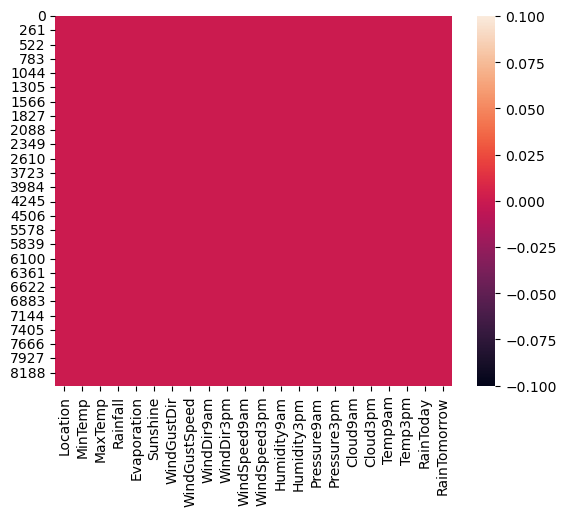

In [22]:
sns.heatmap(df.isnull())

In [23]:
for j in df.columns:
    print(df[j].value_counts())
    print('\n')

PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


 13.109145    70
 13.200000    58
 12.000000    57
 14.800000    53
 12.700000    53
              ..
-1.200000      1
-1.500000      1
-1.700000      1
-0.800000      1
 26.000000     1
Name: MinTemp, Length: 286, dtype: int64


19.000000    66
19.800000    62
24.098345    57
23.800000    54
22.300000    54
             ..
10.300000     1
10.000000     1
10.400000     1
11.700000     1
43.500000     1
Name: MaxTemp, Length: 332, dtype: int64


0.000000      4334
0.200000       321
0.400000       144
2.780148       138
0.600000        87
              ... 
73.800000        1
23.800000        1
61.200000        1
128.000000       1
40.000000        1
Name: Rainfall, Length: 251, dtype: int64


5.302395      2

In [24]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.109145,24.098345,2.780148,5.302395,7.890896,38.977663,12.782206,17.571150,67.506559,50.467147,1017.626311,1015.119923,4.336806,4.320988,17.895038,22.708561
std,5.540667,6.130123,10.482769,3.343713,2.733639,13.376457,9.787577,9.548634,17.182700,18.498341,6.027914,5.967638,2.474649,2.323276,5.722411,5.971845
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.000000,7.890896,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.109145,23.500000,0.000000,5.302395,7.890896,38.977663,11.000000,17.000000,68.000000,50.000000,1017.626311,1015.119923,4.336806,4.320988,17.900000,22.300000
75%,17.400000,28.400000,1.200000,5.302395,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


1.Max temp,Rainfall,WindSpeed9am,windspeed3pm,Humidity3pm shows righ hand side skewness as mean is greater than median

2.Rainfall,Evaporation,WindGustspeed,windspeed9am shows sudden increase in values beyween 75% quantile values and max which shows the presence of outliers

# EDA

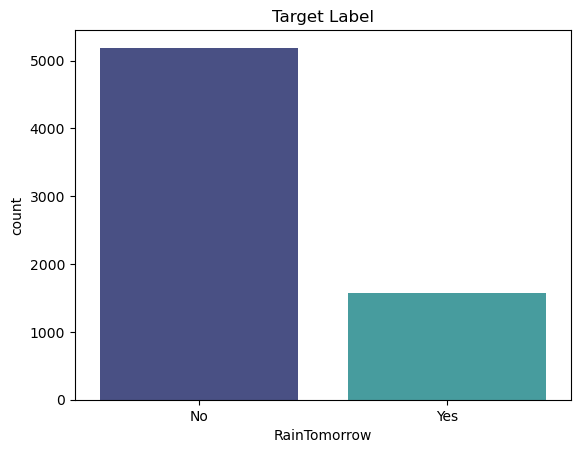

In [25]:
sns.countplot(x='RainTomorrow',data=df,palette='mako')
plt.title("Target Label")
plt.show()

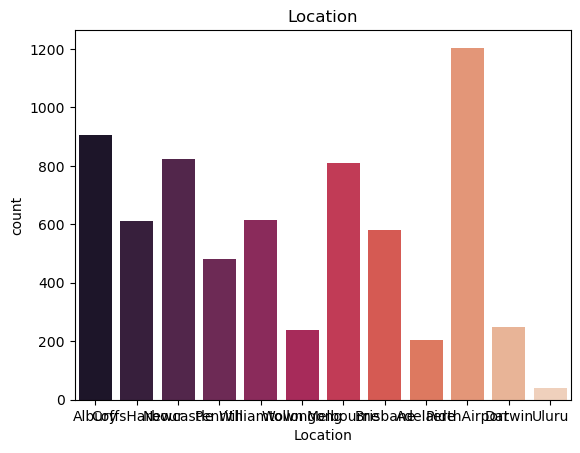

In [26]:
sns.countplot(x='Location',data=df,palette='rocket')
plt.title('Location')
plt.show()

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   object 
 1   MinTemp        6762 non-null   float64
 2   MaxTemp        6762 non-null   float64
 3   Rainfall       6762 non-null   float64
 4   Evaporation    6762 non-null   float64
 5   Sunshine       6762 non-null   float64
 6   WindGustDir    6762 non-null   object 
 7   WindGustSpeed  6762 non-null   float64
 8   WindDir9am     6762 non-null   object 
 9   WindDir3pm     6762 non-null   object 
 10  WindSpeed9am   6762 non-null   float64
 11  WindSpeed3pm   6762 non-null   float64
 12  Humidity9am    6762 non-null   float64
 13  Humidity3pm    6762 non-null   float64
 14  Pressure9am    6762 non-null   float64
 15  Pressure3pm    6762 non-null   float64
 16  Cloud9am       6762 non-null   float64
 17  Cloud3pm       6762 non-null   float64
 18  Temp9am 

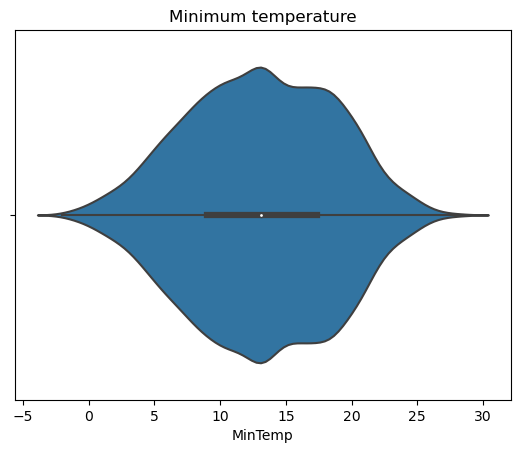

In [28]:
sns.violinplot(x='MinTemp',data=df)
plt.title('Minimum temperature')
plt.show()

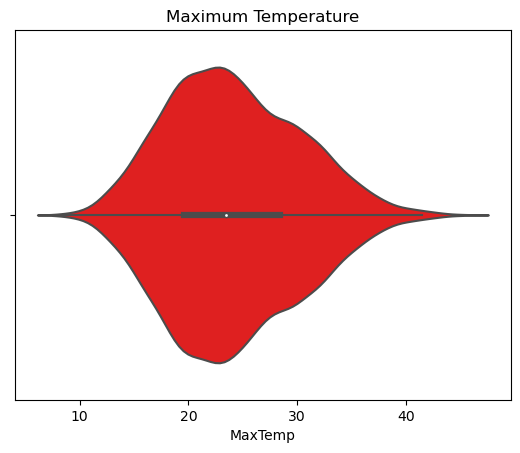

In [29]:
sns.violinplot(data=df,x='MaxTemp',color='Red')
plt.title('Maximum Temperature')
plt.show()

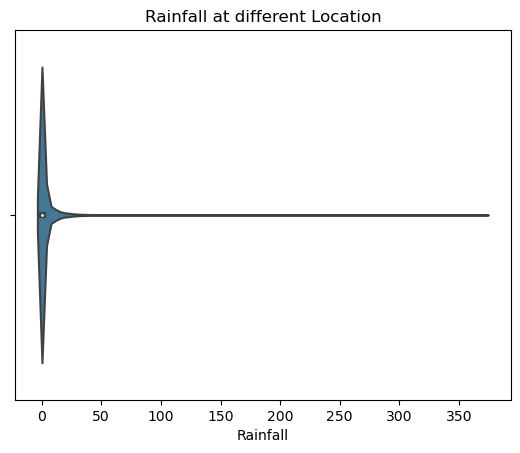

In [30]:
sns.violinplot(x='Rainfall',data=df,palette='mako')
plt.title('Rainfall at different Location')
plt.show()

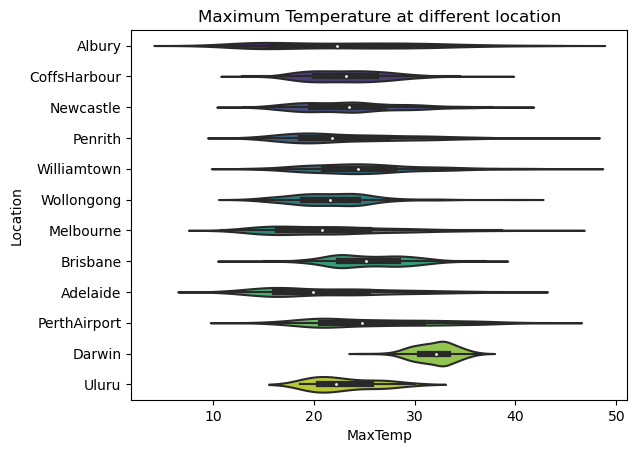

In [31]:
sns.violinplot(x='MaxTemp',y='Location',data=df,palette='viridis')
plt.title('Maximum Temperature at different location')
plt.show()

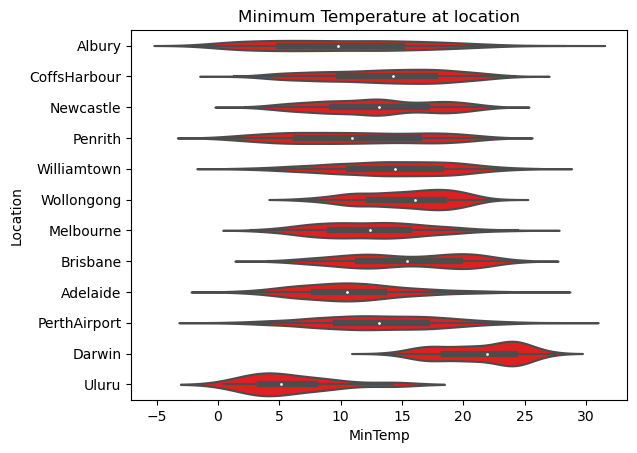

In [32]:
sns.violinplot(x='MinTemp',y='Location',data=df,color='Red')
plt.title('Minimum Temperature at location')
plt.show()

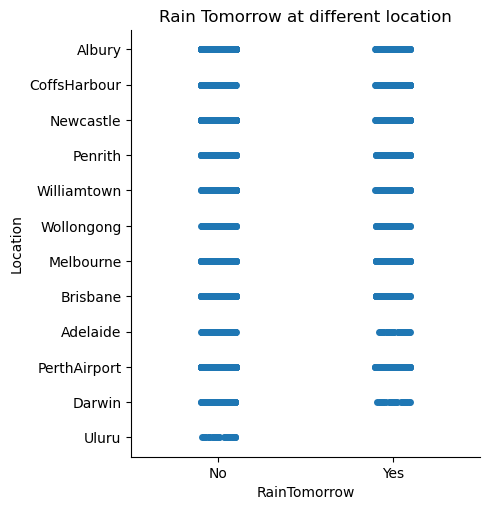

In [33]:
sns.catplot(x='RainTomorrow',y='Location',data=df)
plt.title('Rain Tomorrow at different location')
plt.show()

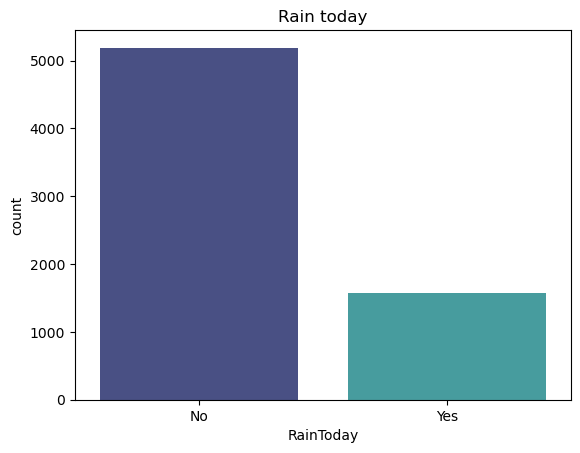

In [34]:
sns.countplot(x='RainToday',data=df,palette='mako')
plt.title('Rain today')
plt.show()

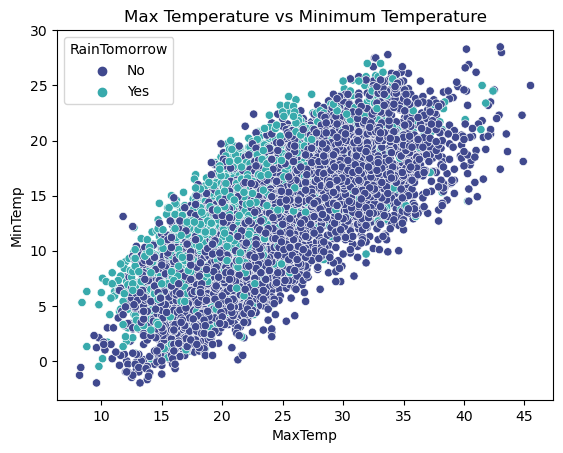

In [35]:
sns.scatterplot(x='MaxTemp',y='MinTemp',hue='RainTomorrow',palette='mako',data=df)
plt.title('Max Temperature vs Minimum Temperature')
plt.show()

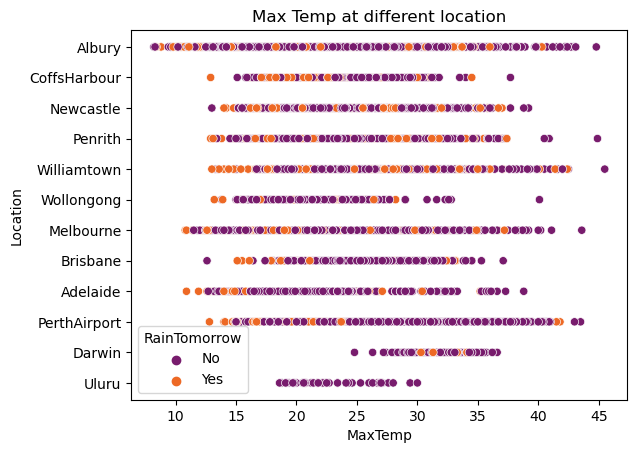

In [36]:
sns.scatterplot(x='MaxTemp',y='Location',hue='RainTomorrow',data=df,palette='inferno')
plt.title('Max Temp at different location')
plt.show()

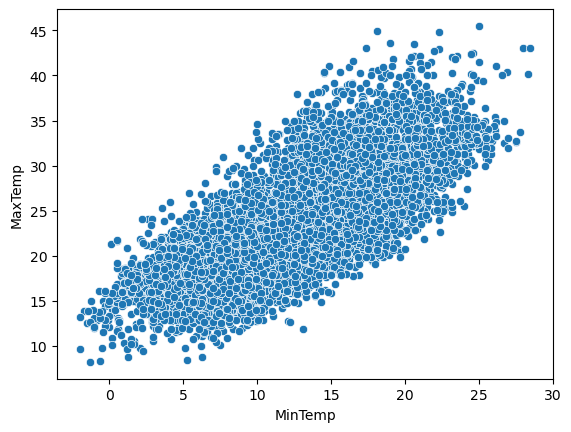

In [37]:
sns.scatterplot(x='MinTemp',y='MaxTemp',data=df,palette='inferno')
plt.show()

<Axes: xlabel='Humidity9am', ylabel='Temp9am'>

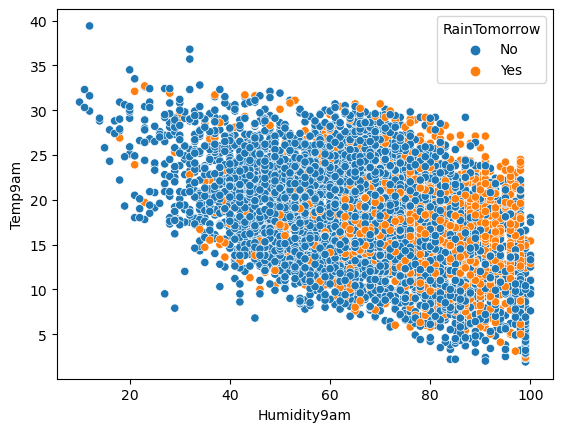

In [38]:
sns.scatterplot(x='Humidity9am',y='Temp9am',hue='RainTomorrow',data=df)

<Axes: xlabel='Cloud3pm', ylabel='Location'>

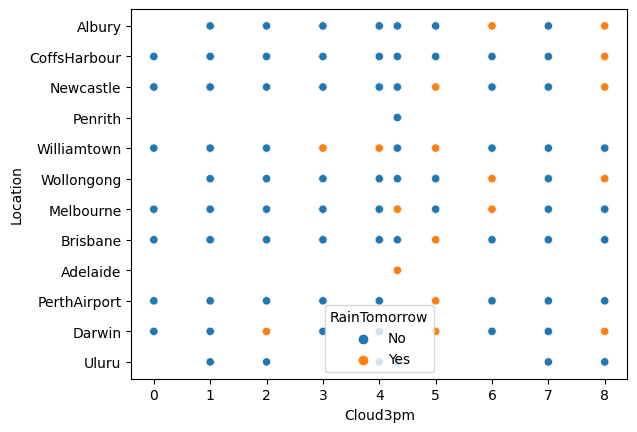

In [39]:
sns.scatterplot(x='Cloud3pm',y='Location',hue='RainTomorrow',data=df)

MinTemp             Axes(0.125,0.798085;0.0824468x0.0819149)
MaxTemp          Axes(0.223936,0.798085;0.0824468x0.0819149)
Rainfall         Axes(0.322872,0.798085;0.0824468x0.0819149)
Evaporation      Axes(0.421809,0.798085;0.0824468x0.0819149)
Sunshine         Axes(0.520745,0.798085;0.0824468x0.0819149)
WindGustSpeed    Axes(0.619681,0.798085;0.0824468x0.0819149)
WindSpeed9am     Axes(0.718617,0.798085;0.0824468x0.0819149)
WindSpeed3pm     Axes(0.817553,0.798085;0.0824468x0.0819149)
Humidity9am         Axes(0.125,0.699787;0.0824468x0.0819149)
Humidity3pm      Axes(0.223936,0.699787;0.0824468x0.0819149)
Pressure9am      Axes(0.322872,0.699787;0.0824468x0.0819149)
Pressure3pm      Axes(0.421809,0.699787;0.0824468x0.0819149)
Cloud9am         Axes(0.520745,0.699787;0.0824468x0.0819149)
Cloud3pm         Axes(0.619681,0.699787;0.0824468x0.0819149)
Temp9am          Axes(0.718617,0.699787;0.0824468x0.0819149)
Temp3pm          Axes(0.817553,0.699787;0.0824468x0.0819149)
dtype: object

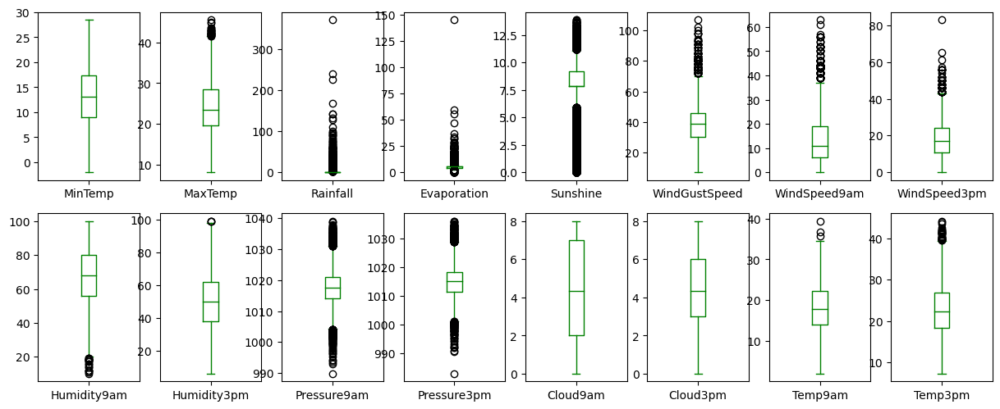

In [40]:
df.plot(kind='box',subplots=True,layout=(8,8),figsize=(15,25),color='green')

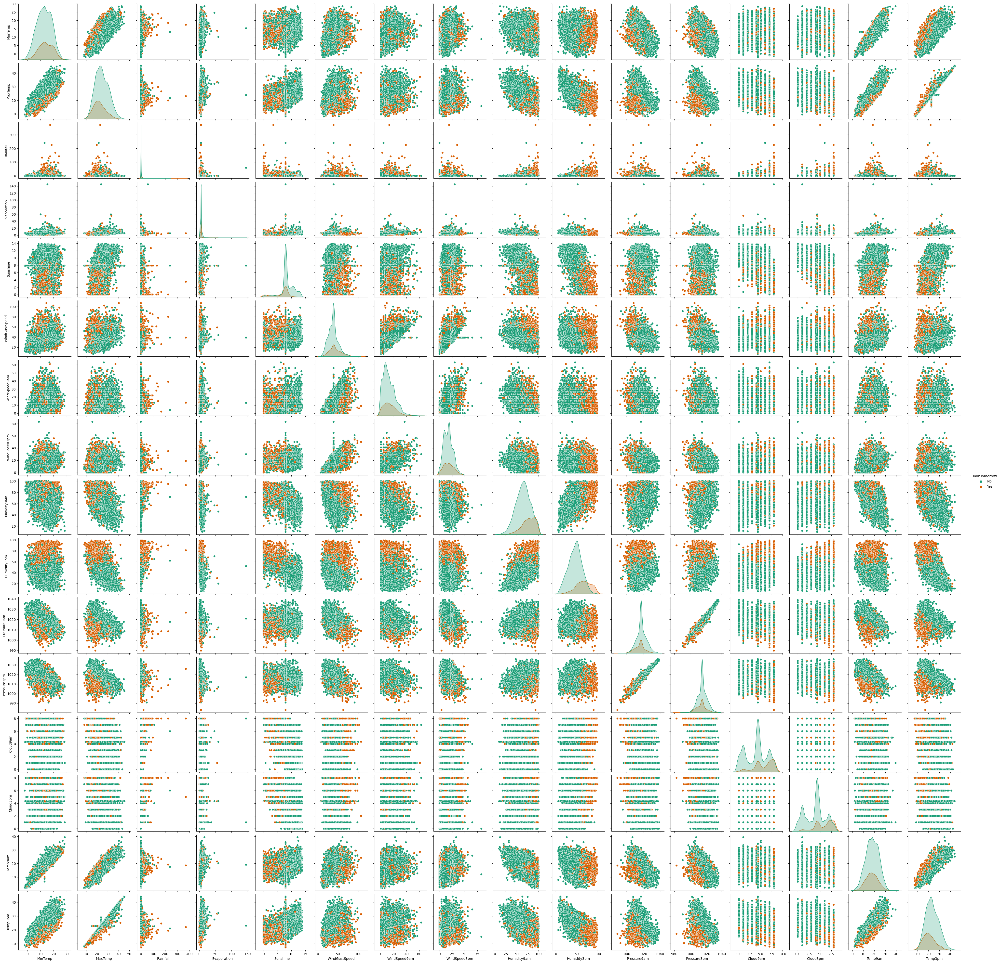

In [41]:
sns.pairplot(data=df,hue='RainTomorrow',palette='Dark2')

array([[<Axes: title={'center': 'MinTemp'}>,
        <Axes: title={'center': 'MaxTemp'}>,
        <Axes: title={'center': 'Rainfall'}>,
        <Axes: title={'center': 'Evaporation'}>,
        <Axes: title={'center': 'Sunshine'}>],
       [<Axes: title={'center': 'WindGustSpeed'}>,
        <Axes: title={'center': 'WindSpeed9am'}>,
        <Axes: title={'center': 'WindSpeed3pm'}>,
        <Axes: title={'center': 'Humidity9am'}>,
        <Axes: title={'center': 'Humidity3pm'}>],
       [<Axes: title={'center': 'Pressure9am'}>,
        <Axes: title={'center': 'Pressure3pm'}>,
        <Axes: title={'center': 'Cloud9am'}>,
        <Axes: title={'center': 'Cloud3pm'}>,
        <Axes: title={'center': 'Temp9am'}>],
       [<Axes: title={'center': 'Temp3pm'}>, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object)

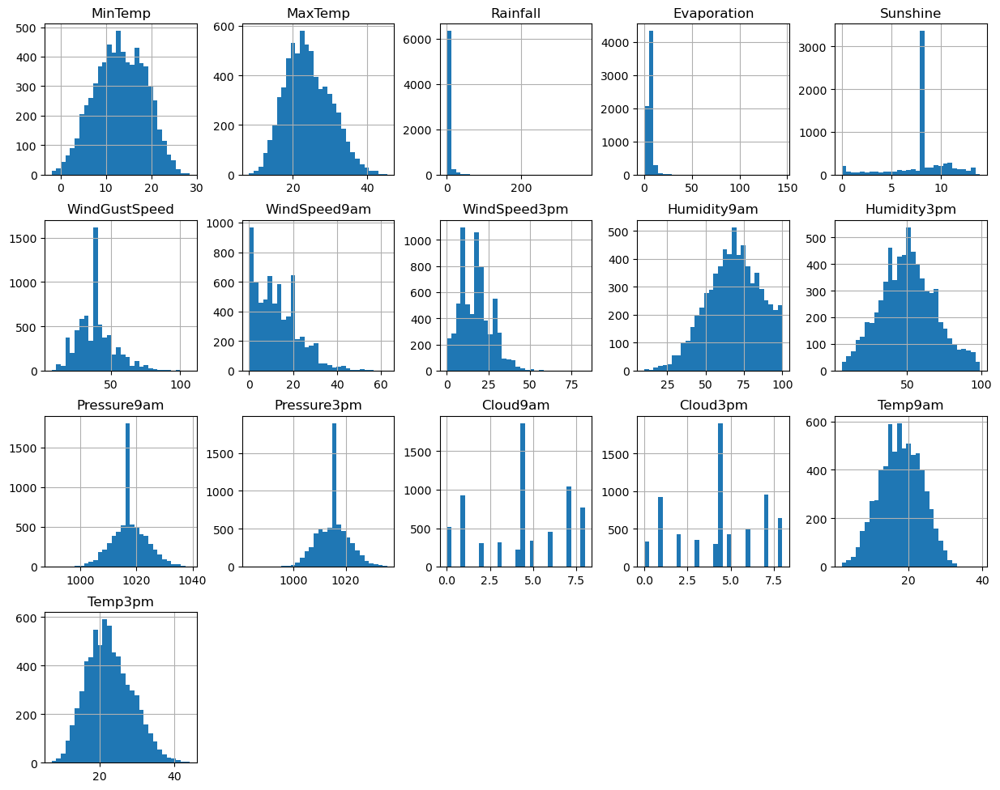

In [42]:
df.hist(layout=(5,5),figsize=(15,15),bins=30)

In [43]:
df.skew()

MinTemp          -0.083706
MaxTemp           0.327598
Rainfall         13.650294
Evaporation      13.553368
Sunshine         -0.882147
WindGustSpeed     0.780437
WindSpeed9am      0.957036
WindSpeed3pm      0.549797
Humidity9am      -0.256177
Humidity3pm       0.150860
Pressure9am       0.022085
Pressure3pm       0.042990
Cloud9am         -0.215085
Cloud3pm         -0.162159
Temp9am          -0.047213
Temp3pm           0.348100
dtype: float64

In [44]:
df['Rainfall']=np.cbrt(df['Rainfall'])
df['Evaporation']=np.cbrt(df['Evaporation'])

In [45]:
df.skew()

MinTemp         -0.083706
MaxTemp          0.327598
Rainfall         1.688052
Evaporation     -0.042985
Sunshine        -0.882147
WindGustSpeed    0.780437
WindSpeed9am     0.957036
WindSpeed3pm     0.549797
Humidity9am     -0.256177
Humidity3pm      0.150860
Pressure9am      0.022085
Pressure3pm      0.042990
Cloud9am        -0.215085
Cloud3pm        -0.162159
Temp9am         -0.047213
Temp3pm          0.348100
dtype: float64

In [46]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=le.fit_transform(df[i].values.reshape(-1,1))

In [47]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.900000,0.843433,1.743776,7.890896,13,44.000000,13,14,...,71.0,22.0,1007.7,1007.1,8.000000,4.320988,16.9,21.8,0,0
1,1,7.4,25.100000,0.000000,1.743776,7.890896,14,44.000000,6,15,...,44.0,25.0,1010.6,1007.8,4.336806,4.320988,17.2,24.3,0,0
2,1,12.9,25.700000,0.000000,1.743776,7.890896,15,46.000000,13,15,...,38.0,30.0,1007.6,1008.7,4.336806,2.000000,21.0,23.2,0,0
3,1,9.2,28.000000,0.000000,1.743776,7.890896,4,24.000000,9,0,...,45.0,16.0,1017.6,1012.8,4.336806,4.320988,18.1,26.5,0,0
4,1,17.5,32.300000,1.000000,1.743776,7.890896,13,41.000000,1,7,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,0.000000,1.743776,7.890896,0,31.000000,9,1,...,51.0,24.0,1024.6,1020.3,4.336806,4.320988,10.1,22.4,0,0
8421,9,3.6,25.300000,0.000000,1.743776,7.890896,6,22.000000,9,3,...,56.0,21.0,1023.5,1019.1,4.336806,4.320988,10.9,24.5,0,0
8422,9,5.4,26.900000,0.000000,1.743776,7.890896,3,37.000000,9,14,...,53.0,24.0,1021.0,1016.8,4.336806,4.320988,12.5,26.1,0,0
8423,9,7.8,27.000000,0.000000,1.743776,7.890896,9,28.000000,10,3,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0


In [48]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.090425,0.070878,0.010377,0.127156,0.065573,-0.074300,0.260031,-0.088884,-0.001275,...,-0.033657,-0.001483,-0.037657,-0.024508,-0.008566,-0.010776,0.098533,0.066331,-0.004280,-0.004506
MinTemp,0.090425,1.000000,0.728065,0.101617,0.333271,0.039286,-0.150658,0.242738,-0.020766,-0.139552,...,-0.154248,0.067683,-0.441253,-0.440363,0.095403,0.047495,0.891425,0.696419,0.075933,0.097146
MaxTemp,0.070878,0.728065,1.000000,-0.222646,0.436617,0.355675,-0.217844,0.165528,-0.192684,-0.160967,...,-0.424951,-0.430526,-0.337845,-0.413150,-0.245116,-0.241542,0.866584,0.974695,-0.225749,-0.160318
Rainfall,0.010377,0.101617,-0.222646,1.000000,-0.152570,-0.298512,0.120100,0.107107,0.160258,0.097389,...,0.423268,0.412276,-0.131729,-0.055814,0.333127,0.283771,-0.080810,-0.233395,0.859484,0.356514
Evaporation,0.127156,0.333271,0.436617,-0.152570,1.000000,0.366437,-0.124386,0.173373,-0.098258,-0.034007,...,-0.294734,-0.233290,-0.256328,-0.274691,-0.093941,-0.141825,0.392585,0.427794,-0.164835,-0.097487
Sunshine,0.065573,0.039286,0.355675,-0.298512,0.366437,1.000000,-0.107111,0.007625,-0.082495,-0.053334,...,-0.378872,-0.445111,-0.002095,-0.058151,-0.542442,-0.562537,0.236174,0.374244,-0.256123,-0.345509
WindGustDir,-0.074300,-0.150658,-0.217844,0.120100,-0.124386,-0.107111,1.000000,0.010963,0.385221,0.502140,...,0.041047,0.048519,-0.110663,-0.027566,0.115919,0.084145,-0.171232,-0.231559,0.123042,0.048487
WindGustSpeed,0.260031,0.242738,0.165528,0.107107,0.173373,0.007625,0.010963,1.000000,-0.071934,0.078165,...,-0.268973,-0.095502,-0.394164,-0.363104,0.013532,0.058182,0.221725,0.129756,0.085806,0.184435
WindDir9am,-0.088884,-0.020766,-0.192684,0.160258,-0.098258,-0.082495,0.385221,-0.071934,1.000000,0.216648,...,0.015585,0.126725,-0.027555,0.051694,0.079312,0.058119,-0.071087,-0.201267,0.157884,0.040399
WindDir3pm,-0.001275,-0.139552,-0.160967,0.097389,-0.034007,-0.053334,0.502140,0.078165,0.216648,1.000000,...,-0.005578,-0.009618,-0.139023,-0.049330,0.070565,0.050584,-0.146456,-0.174885,0.094507,0.004301


<Axes: >

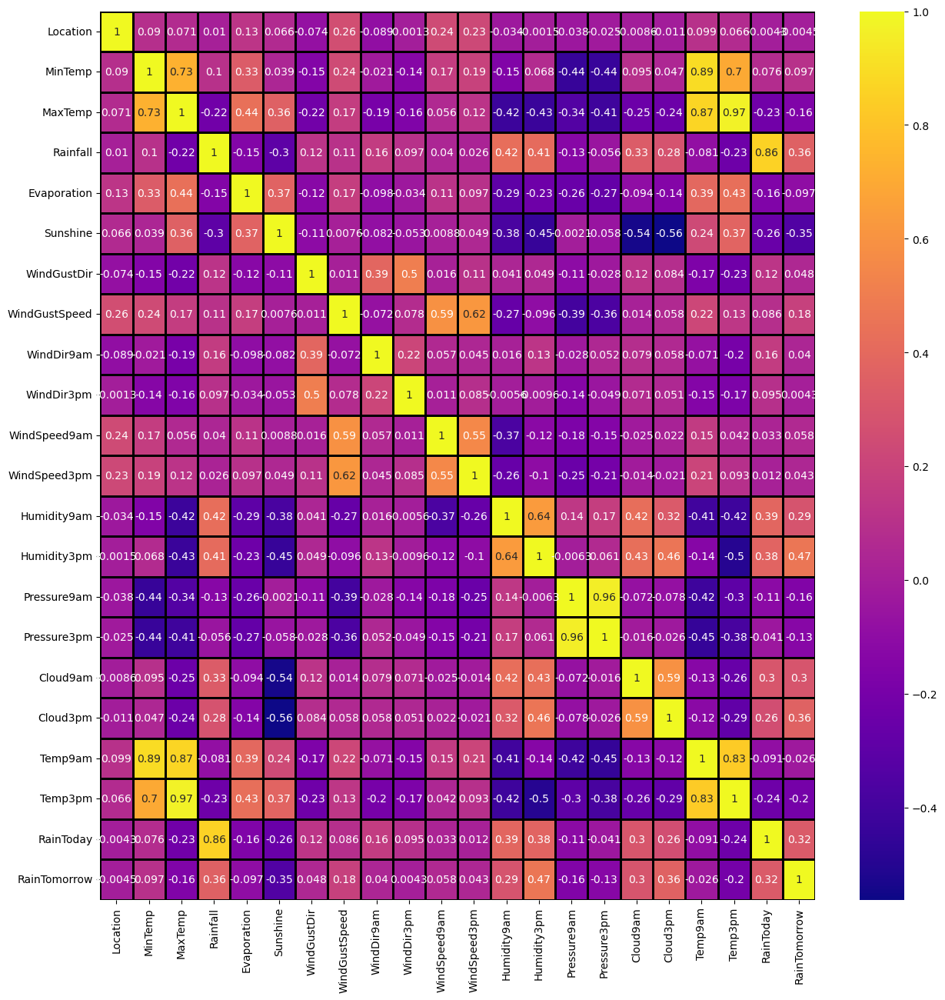

In [49]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),cmap='plasma',annot=True,linewidths=2,linecolor='Black')

In [50]:
from scipy.stats import zscore
z=np.abs(zscore(df))
print(np.where(z>3))

dfn=df[(z<3).all(axis=1)]
dfn.head(5)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
         62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
        381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
        568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
        770,  795,  796,  797,  802,  928,  928,  935,  949,  979,  980,
        980,  980, 1008, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1189,
       1203, 1237, 1241, 1264, 1265, 1357, 1369, 1387, 1411, 1412, 1413,
       1426, 1467, 1479, 1480, 1480, 1481, 1513, 1535, 1587, 1644, 1661,
       1665, 1673, 1680, 1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028,
       2043, 2074, 2108, 2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265,
       2429, 2488, 2500, 2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735,
       2827, 2835, 2838, 2849, 2849, 2855, 2859, 2863, 2869, 2877, 2883,
       2890, 2891, 2897, 2898, 2900, 2900, 2901, 2905, 2909, 2911, 2919,
       2925, 2933, 2939, 2947, 2953, 2961, 2967, 2

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.843433,1.743776,7.890896,13,44.0,13,14,...,71.0,22.0,1007.7,1007.1,8.000000,4.320988,16.9,21.8,0,0
1,1,7.4,25.1,0.000000,1.743776,7.890896,14,44.0,6,15,...,44.0,25.0,1010.6,1007.8,4.336806,4.320988,17.2,24.3,0,0
2,1,12.9,25.7,0.000000,1.743776,7.890896,15,46.0,13,15,...,38.0,30.0,1007.6,1008.7,4.336806,2.000000,21.0,23.2,0,0
3,1,9.2,28.0,0.000000,1.743776,7.890896,4,24.0,9,0,...,45.0,16.0,1017.6,1012.8,4.336806,4.320988,18.1,26.5,0,0
4,1,17.5,32.3,1.000000,1.743776,7.890896,13,41.0,1,7,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


In [51]:
dfn.shape

(6378, 22)

In [52]:
df.shape

(6762, 22)

In [53]:
x=dfn.drop('RainTomorrow',axis=1)
y=dfn['RainTomorrow']

In [54]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
x=pd.DataFrame(scale.fit_transform(x),columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-1.390618,0.064476,-0.198726,0.406579,0.207473,-0.026031,1.249389,0.480083,1.318383,1.374217,...,0.755502,0.206872,-1.555404,-1.757015,-1.434634,1.498274,0.019698,-0.169831,-0.157433,-0.532017
1,-1.390618,-1.017039,0.166765,-0.632869,0.207473,-0.026031,1.458002,0.480083,-0.221179,1.597483,...,0.535039,-1.388881,-1.390460,-1.249315,-1.310865,0.016596,0.019698,-0.117059,0.269086,-0.532017
2,-1.390618,-0.025651,0.266445,-0.632869,0.207473,-0.026031,1.666615,0.643205,1.318383,1.597483,...,0.975964,-1.743493,-1.115553,-1.774522,-1.151733,0.016596,-0.981061,0.551395,0.081417,-0.532017
3,-1.390618,-0.692585,0.648549,-0.632869,0.207473,-0.026031,-0.628129,-1.151133,0.438634,-1.751508,...,-0.897967,-1.329779,-1.885292,-0.023831,-0.426798,0.016596,0.019698,0.041259,0.644423,-0.532017
4,-1.390618,0.803511,1.362918,0.599533,0.207473,-0.026031,1.249389,0.235401,-1.320866,-0.188645,...,0.314577,0.856994,-0.950609,-1.214301,-1.629129,1.093797,1.606006,-0.011513,1.190367,-0.532017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6373,1.200679,-1.846201,-0.115660,-0.632869,0.207473,-0.026031,-1.462581,-0.580207,0.438634,-1.528242,...,-0.677505,-0.975167,-1.445441,1.201653,0.899303,0.016596,0.019698,-1.366012,-0.055069,-0.532017
6374,1.200679,-1.701999,0.199992,-0.632869,0.207473,-0.026031,-0.210903,-1.314255,0.438634,-1.081710,...,-0.897967,-0.679657,-1.610385,1.009077,0.687127,0.016596,0.019698,-1.225285,0.303207,-0.532017
6375,1.200679,-1.377544,0.465803,-0.632869,0.207473,-0.026031,-0.836742,-0.090843,0.438634,1.374217,...,-0.897967,-0.856963,-1.445441,0.571404,0.280456,0.016596,0.019698,-0.943830,0.576180,-0.532017
6376,1.200679,-0.944938,0.482417,-0.632869,0.207473,-0.026031,0.414937,-0.824890,0.658571,-1.081710,...,-1.118430,-0.975167,-1.445441,0.291293,0.227412,-0.524111,-0.981061,-0.486467,0.559119,-0.532017


In [55]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['VIF values']=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif['Features']=x.columns

vif

,VIF values,Features
0,1.158869,Location
1,9.019547,MinTemp
2,26.126371,MaxTemp
3,4.744662,Rainfall
4,1.534184,Evaporation
5,2.004265,Sunshine
6,1.607071,WindGustDir
7,2.219883,WindGustSpeed
8,1.332069,WindDir9am
9,1.460663,WindDir3pm


In [56]:
x.drop('Temp3pm',axis=1,inplace=True)

In [57]:
vif=pd.DataFrame()

vif['VIF values']=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif['Feature']=x.columns

vif

,VIF values,Feature
0,1.158416,Location
1,8.954867,MinTemp
2,9.578291,MaxTemp
3,4.744442,Rainfall
4,1.532828,Evaporation
5,2.004120,Sunshine
6,1.603488,WindGustDir
7,2.209325,WindGustSpeed
8,1.330739,WindDir9am
9,1.460225,WindDir3pm


In [58]:
x.drop('Pressure9am',axis=1,inplace=True)

In [59]:
vif=pd.DataFrame()
vif['Value']=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif['Feature']=x.columns

vif

,Value,Feature
0,1.157792,Location
1,8.857048,MinTemp
2,9.238185,MaxTemp
3,4.720358,Rainfall
4,1.517482,Evaporation
5,1.998552,Sunshine
6,1.584966,WindGustDir
7,2.195672,WindGustSpeed
8,1.310396,WindDir9am
9,1.394487,WindDir3pm


In [60]:
x.drop('Temp9am',axis=1,inplace=True)

In [61]:
vif=pd.DataFrame()
vif['Value']=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif['Feature']=x.columns

vif

,Value,Feature
0,1.149900,Location
1,4.663915,MinTemp
2,5.619761,MaxTemp
3,4.720333,Rainfall
4,1.505449,Evaporation
5,1.976634,Sunshine
6,1.584258,WindGustDir
7,2.165952,WindGustSpeed
8,1.309638,WindDir9am
9,1.394416,WindDir3pm


In [62]:
y.value_counts()

0    4957
1    1421
Name: RainTomorrow, dtype: int64

In [63]:
!pip install imblearn
from imblearn.over_sampling import SMOTE
smt=SMOTE()
x1,y1=smt.fit_resample(x,y)

Defaulting to user installation because normal site-packages is not writeable


In [64]:
y1.value_counts()

0    4957
1    4957
Name: RainTomorrow, dtype: int64

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split

In [66]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    rf=RandomForestClassifier()
    rf.fit(x_train,y_train)
    rfpred=rf.predict(x_test)
    acc=accuracy_score(y_test,rfpred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is:',maxAccu,'at random state is:',maxRS)

Best accuracy is: 0.9126050420168067 at random state is: 42


In [67]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
lrpred=lr.predict(x_test)
print('Accuracy score',accuracy_score(y_test,lrpred))
print('Confusion matrix',confusion_matrix(y_test,lrpred))
print('Classification report',classification_report(y_test,lrpred))

Accuracy score 0.7865546218487395
Confusion matrix [[1205  293]
 [ 342 1135]]
Classification report               precision    recall  f1-score   support

           0       0.78      0.80      0.79      1498
           1       0.79      0.77      0.78      1477

    accuracy                           0.79      2975
   macro avg       0.79      0.79      0.79      2975
weighted avg       0.79      0.79      0.79      2975



In [68]:
ET=ExtraTreesClassifier()
ET.fit(x_train,y_train)
etpred=ET.predict(x_test)
print('Accuracy score',accuracy_score(y_test,etpred))
print('Confusion_matrix',confusion_matrix(y_test,etpred))
print('Classification report',classification_report(y_test,etpred))

Accuracy score 0.9203361344537815
Confusion_matrix [[1349  149]
 [  88 1389]]
Classification report               precision    recall  f1-score   support

           0       0.94      0.90      0.92      1498
           1       0.90      0.94      0.92      1477

    accuracy                           0.92      2975
   macro avg       0.92      0.92      0.92      2975
weighted avg       0.92      0.92      0.92      2975



In [69]:
svc=SVC()
rf=RandomForestClassifier()
knn=KNeighborsClassifier()
dtc=DecisionTreeClassifier()
gb=GradientBoostingClassifier()

model=[svc,rf,knn,dtc,gb]

for l in model:
    l.fit(x_train,y_train)
    predict=l.predict(x_test)
    print('Accuracy score of:',l)
    print('Accuracy score',accuracy_score(y_test,predict))
    print('Confusion matrix',confusion_matrix(y_test,predict))
    print('Classification report',classification_report(y_test,predict))
    print("---------------------------------------------------------------")

Accuracy score of: SVC()
Accuracy score 0.8369747899159664
Confusion matrix [[1225  273]
 [ 212 1265]]
Classification report               precision    recall  f1-score   support

           0       0.85      0.82      0.83      1498
           1       0.82      0.86      0.84      1477

    accuracy                           0.84      2975
   macro avg       0.84      0.84      0.84      2975
weighted avg       0.84      0.84      0.84      2975

---------------------------------------------------------------
Accuracy score of: RandomForestClassifier()
Accuracy score 0.895126050420168
Confusion matrix [[1319  179]
 [ 133 1344]]
Classification report               precision    recall  f1-score   support

           0       0.91      0.88      0.89      1498
           1       0.88      0.91      0.90      1477

    accuracy                           0.90      2975
   macro avg       0.90      0.90      0.90      2975
weighted avg       0.90      0.90      0.90      2975

--------------

In [70]:
from sklearn.model_selection import cross_val_score

for l in model:
    print('Cross Validation score is:',l)
    score=cross_val_score(l,x1,y1,cv=5)
    print(score)
    crossval=score.mean()
    print('Cross validation score:',crossval)
    print('Difference between cross validation score and accuracy is:',abs(acc-crossval))
    print('-------------------------------------------------------------------------------')


Cross Validation score is: SVC()
[0.72314675 0.57438225 0.6727181  0.81290973 0.839556  ]
Cross validation score: 0.7245425674235033
Difference between cross validation score and accuracy is: 0.1783145754336395
-------------------------------------------------------------------------------
Cross Validation score is: RandomForestClassifier()
[0.6878467  0.58951084 0.66111952 0.80837115 0.90413724]
Cross validation score: 0.7301970889798403
Difference between cross validation score and accuracy is: 0.17266005387730254
-------------------------------------------------------------------------------
Cross Validation score is: KNeighborsClassifier()
[0.71255673 0.57589511 0.69188099 0.77609682 0.83047427]
Cross validation score: 0.7173807840916203
Difference between cross validation score and accuracy is: 0.1854763587655225
-------------------------------------------------------------------------------
Cross Validation score is: DecisionTreeClassifier()
[0.58043369 0.56732224 0.64548664 0.75

In [71]:
score=cross_val_score(ET,x1,y1,cv=5)
print(score)
print(score.mean())
print('Difference between cross validation and accuracy is:',accuracy_score(y_test,etpred)-score.mean())

[0.75441251 0.61926374 0.71558245 0.86283409 0.91069627]
0.7725578110203124
Difference between cross validation and accuracy is: 0.14777832343346908


In [72]:
score=cross_val_score(lr,x1,y1,cv=5)
print(score)
print(score.mean())
print('Difference between cross validation and accuracy is:',accuracy_score(y_test,lrpred)-score.mean())

[0.71356531 0.68734241 0.64952093 0.76601109 0.81937437]
0.7271628214189938
Difference between cross validation and accuracy is: 0.05939180042974568


In [73]:
from sklearn.model_selection import GridSearchCV
parameters={'criterion':['gini','entropy'],
           'random_state':[10,20,50,100,1000],
           'max_depth':[0,5,10,15,20],
           'n_jobs':[-2,-1,1],
           'n_estimators':[50,100,200,300,500]}
GV=GridSearchCV(RandomForestClassifier(),parameters,cv=5)
GV.fit(x_train,y_train)
GV.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 500,
 'n_jobs': -2,
 'random_state': 20}

In [77]:
Final=RandomForestClassifier(criterion='entropy',max_depth=20,n_estimators=500,n_jobs=-2,random_state=20)
Final.fit(x_train,y_train)
Predict=Final.predict(x_test)
Accuracy=accuracy_score(y_test,Predict)
Accuracy*100

90.55462184873949

In [75]:
from sklearn.model_selection import GridSearchCV
par={'penalty':['l1','l2','elasticnet','none'],
    'C':np.logspace(-4,4,20),
    'solver':['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter':[100,200,500,1000]}
GV=GridSearchCV(LogisticRegression(),par,cv=5)
GV.fit(x_train,y_train)
GV.best_params_

{'C': 0.012742749857031334,
 'max_iter': 100,
 'penalty': 'l2',
 'solver': 'liblinear'}

In [76]:
Model=LogisticRegression(max_iter=100,penalty='l2',solver='saga',C=0.08858667904100823)
Model.fit(x_train,y_train)
pred=Model.predict(x_test)
Acc=accuracy_score(y_test,pred)
Acc*100

78.65546218487395

In [79]:
import joblib
joblib.dump(Final,'rainfall_prediction.pkl')

['rainfall_prediction.pkl']

In [81]:
mod=joblib.load('rainfall_prediction.pkl')
Predictions=mod.predict(x_test)
Predictions

array([1, 1, 1, ..., 1, 1, 1])

In [82]:
l=np.array(y_test)
dat=pd.DataFrame()
dat['Prediction']=Predictions
dat['Originals']=l
dat

,Prediction,Originals
0,1,1
1,1,0
2,1,1
3,1,1
4,1,1
...,...,...
2970,0,0
2971,0,0
2972,1,1
2973,1,1
